In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Data Preparation

In [2]:
df = pd.read_csv('imbd_cleaned.csv')

# Mappa di raggruppamento
category_mapping = {
    'movie': 'Film',
    'tvMovie': 'Film',
    'short': 'Shorts',
    'tvShort': 'Shorts',
    'tvSeries': 'Serie TV',
    'tvMiniSeries': 'Serie TV',
    'tvEpisode': 'Serie TV',
    'tvSpecial': 'Speciale TV',
    'video': 'Video',
    'videoGame': 'Videogame'
}

# Applicare la mappa al dataframe
df['titleType'] = df['titleType'].map(category_mapping)

X = df.select_dtypes(include=['number'])

X = X.values
y = np.array(df['titleType'])

In [3]:
from sklearn.model_selection import train_test_split, cross_val_score 

from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100, stratify=y)

In [5]:
from sklearn.preprocessing import StandardScaler

In [6]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# Sklearn Multilayer Perceptron

In [7]:
from sklearn.neural_network import MLPClassifier

In [75]:
hidden_layer_sizes = (100, 200,)

In [76]:
clf = MLPClassifier(random_state=0)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

c:\Users\Tommaso\Documents\Università\Magistrale\Primo anno (2 su 8)\Secondo semestre (0 su 5)\Data Mining 2\DM2 project\Data-Mining-2\dm2_pytorch_env\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Accuracy 0.9261036253166828
F1-score [0.91876342 0.96820193 0.89195631 0.27125506 0.54593573 0.75559534]
              precision    recall  f1-score   support

        Film       0.90      0.93      0.92     12815
    Serie TV       0.97      0.97      0.97     24378
      Shorts       0.88      0.90      0.89      4994
 Speciale TV       0.45      0.19      0.27       344
       Video       0.66      0.47      0.55      1543
   Videogame       0.72      0.80      0.76       529

    accuracy                           0.93     44603
   macro avg       0.76      0.71      0.73     44603
weighted avg       0.92      0.93      0.92     44603



In [81]:
mlpparameters = clf.get_params()
layers = clf.hidden_layer_sizes
print(layers)
print(mlpparameters)

(128, 64, 32)
{'activation': 'tanh', 'alpha': 0.1, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (128, 64, 32), 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_fun': 15000, 'max_iter': 500, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': 0, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}


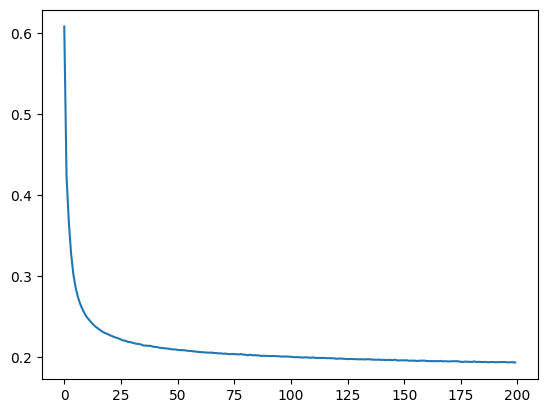

In [79]:
plt.plot(clf.loss_curve_)
plt.show()

In [80]:
clf = MLPClassifier(hidden_layer_sizes=(128, 64, 32,), alpha=0.1,
                    learning_rate='adaptive',
                    activation='tanh', early_stopping=False,
                    momentum=0.9, random_state=0, max_iter=500)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

Accuracy 0.9265296056319081
F1-score [0.92088238 0.96621663 0.88626292 0.29045643 0.54801125 0.77134446]
              precision    recall  f1-score   support

        Film       0.92      0.92      0.92     12815
    Serie TV       0.95      0.98      0.97     24378
      Shorts       0.87      0.90      0.89      4994
 Speciale TV       0.51      0.20      0.29       344
       Video       0.72      0.44      0.55      1543
   Videogame       0.80      0.74      0.77       529

    accuracy                           0.93     44603
   macro avg       0.80      0.70      0.73     44603
weighted avg       0.92      0.93      0.92     44603



In [ ]:
plt.plot(clf.loss_curve_)
plt.show()

In [9]:
from sklearn.preprocessing import LabelEncoder

# Se non l'hai già fatto
le = LabelEncoder() 
y_train = le.fit_transform(y_train) 
y_test = le.transform(y_test) 

In [84]:
clf = MLPClassifier(hidden_layer_sizes=(128, 64, 32,), alpha=0.1, learning_rate='adaptive',
                    activation='tanh', early_stopping=True, momentum=0.9, random_state=0)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

Accuracy 0.9219559222473824
F1-score [0.9149285  0.9639746  0.88212396 0.10796915 0.51164725 0.75024108]
              precision    recall  f1-score   support

           0       0.89      0.94      0.91     12815
           1       0.96      0.97      0.96     24378
           2       0.88      0.88      0.88      4994
           3       0.47      0.06      0.11       344
           4       0.71      0.40      0.51      1543
           5       0.77      0.74      0.75       529

    accuracy                           0.92     44603
   macro avg       0.78      0.66      0.69     44603
weighted avg       0.92      0.92      0.92     44603



In [ ]:
plt.plot(clf.loss_curve_)
plt.show()

In [85]:
from sklearn.model_selection import RandomizedSearchCV

In [86]:
param_list = {
    'hidden_layer_sizes': [(256, 128, 64,), (128, 64, 32,), (64, 32,)],
    'alpha': [0.1, 0.01, 0.001],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam'],
    'early_stopping': [True, False]
}

In [87]:
random_search = RandomizedSearchCV(
    MLPClassifier(random_state=0, max_iter=1000),
    param_distributions=param_list,
    n_jobs=-1,
    refit=True,
    verbose=2
)

In [88]:
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=MLPClassifier(max_iter=1000, random_state=0),
                   n_jobs=-1,
                   param_distributions={'activation': ['tanh', 'relu',
                                                       'logistic'],
                                        'alpha': [0.1, 0.01, 0.001],
                                        'early_stopping': [True, False],
                                        'hidden_layer_sizes': [(256, 128, 64),
                                                               (128, 64, 32),
                                                               (64, 32)],
                                        'solver': ['sgd', 'adam']},
                   verbose=2)

In [90]:
print(random_search.best_params_, random_search.best_score_)

{'solver': 'adam', 'hidden_layer_sizes': (256, 128, 64), 'early_stopping': True, 'alpha': 0.01, 'activation': 'relu'} 0.925542641260256


In [10]:
#FAI PRIMA LABEL ENCODER
# Crea il modello SVM con kernel RBF e i parametri forniti
model = MLPClassifier(solver='adam', alpha=0.01, hidden_layer_sizes=(256, 128, 64), activation='relu',
                      early_stopping=True, random_state=0, max_iter=1000)

# Addestra il modello
model.fit(X_train, y_train)

# Fai previsioni
y_pred = model.predict(X_test)

# Stampa i risultati
print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

Accuracy 0.9269555859471336
F1-score [0.9203533  0.96928747 0.88837303 0.32806324 0.56187767 0.76      ]
              precision    recall  f1-score   support

           0       0.91      0.94      0.92     12815
           1       0.97      0.97      0.97     24378
           2       0.90      0.88      0.89      4994
           3       0.51      0.24      0.33       344
           4       0.62      0.51      0.56      1543
           5       0.73      0.79      0.76       529

    accuracy                           0.93     44603
   macro avg       0.77      0.72      0.74     44603
weighted avg       0.92      0.93      0.92     44603



In [14]:
y_prob = model.predict_proba(X_test)

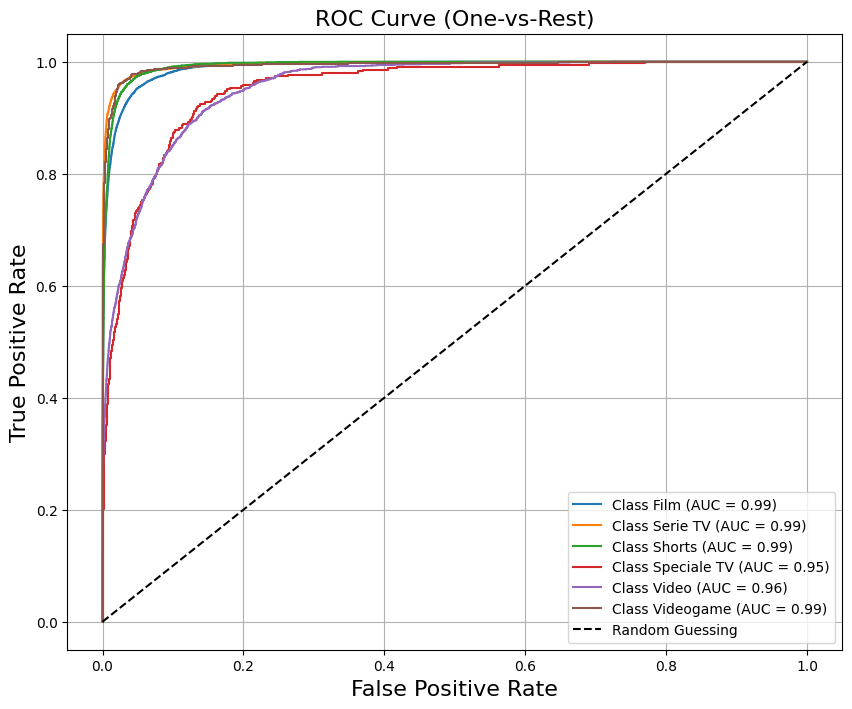

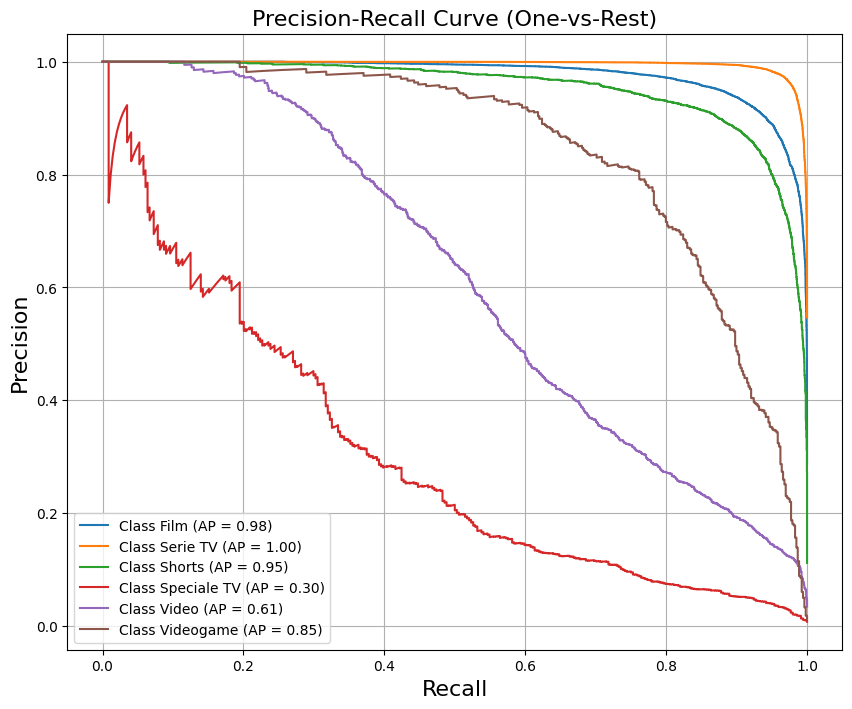

In [16]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

# Classi uniche nel dataset
classes = np.unique(y_test)

# Binarizza y_val
y_test_binarized = label_binarize(y_test, classes=classes)

y_test_binarized
plt.figure(figsize=(10, 8))

for i, class_label in enumerate(le.classes_):
    # ROC curve per la classe i
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_prob[:, i])
    auc = roc_auc_score(y_test_binarized[:, i], y_prob[:, i])
    
    # Traccia la curva ROC
    plt.plot(fpr, tpr, label=f"Class {class_label} (AUC = {auc:.2f})")

# Linea casuale per riferimento
plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")

# Personalizza il grafico
plt.xlabel("False Positive Rate", fontsize=16)
plt.ylabel("True Positive Rate", fontsize=16)
plt.title("ROC Curve (One-vs-Rest)", fontsize=16)
plt.legend(loc="best")
plt.grid()
plt.show()
# AUC (AREA UNDER THE CURVE, Ti dice quanto bene il modello riesce a distinguere tra le classi.) 
# media di tutte le classi (le singole sono gia nel grafico)
roc_auc_score(y_test_binarized, y_prob, multi_class="ovr", average="macro")
from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(10, 8))

for i, class_label in enumerate(le.classes_):
    # Precision-Recall curve per la classe i
    precision, recall, _ = precision_recall_curve(y_test_binarized[:, i], y_prob[:, i])
    ap = average_precision_score(y_test_binarized[:, i], y_prob[:, i])
    
    # Traccia la curva Precision-Recall
    plt.plot(recall, precision, label=f"Class {class_label} (AP = {ap:.2f})")

# Personalizza il grafico
plt.xlabel("Recall", fontsize=16)
plt.ylabel("Precision", fontsize=16)
plt.title("Precision-Recall Curve (One-vs-Rest)", fontsize=16)
plt.legend(loc="best")
plt.grid()
plt.show()

### FAI LA ROC

In [93]:
y_pred = random_search.predict(X_test).astype(int)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

Accuracy 0.9269555859471336
F1-score [0.9203533  0.96928747 0.88837303 0.32806324 0.56187767 0.76      ]
              precision    recall  f1-score   support

           0       0.91      0.94      0.92     12815
           1       0.97      0.97      0.97     24378
           2       0.90      0.88      0.89      4994
           3       0.51      0.24      0.33       344
           4       0.62      0.51      0.56      1543
           5       0.73      0.79      0.76       529

    accuracy                           0.93     44603
   macro avg       0.77      0.72      0.74     44603
weighted avg       0.92      0.93      0.92     44603



# PyTorch

In [ ]:
# !pip3 install torch
# !pip install torchsummary
# !pip install pytorch-ignite

In [21]:
import torch
import torch.nn as nn
import torch.optim as optim

from torchsummary import summary
from torch.utils.data import TensorDataset, DataLoader

from ignite.metrics import Accuracy, Loss
from ignite.engine import Engine, Events, create_supervised_trainer, create_supervised_evaluator

In [22]:
# creates validation set
X_val, X_new_test, y_val, y_new_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42, stratify=y_test)

In [ ]:
# a = np.unique(y_train)
# a

array(['Film', 'Serie TV', 'Shorts', 'Speciale TV', 'Video', 'Videogame'],
      dtype=object)

In [ ]:
y_val = le.transform(y_val)  # anche il validation set se serve
y_new_test = le.transform(y_new_test)


In [34]:
# numpy to tensor
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

X_test_tensor = torch.tensor(X_new_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_new_test, dtype=torch.long)

In [35]:
# creates tensor dataset (can be later loaded)
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

In [36]:
# creates data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)

In [37]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [ ]:
class CustomModel(nn.Module):
    def __init__(self, input_size, hidden_size1, hidden_size2, output_size):
        super(CustomModel, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size1)
        self.fc2 = nn.Linear(hidden_size1, hidden_size2)
        self.fc3 = nn.Linear(hidden_size2, output_size)
        self.relu = nn.ReLU()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.softmax(self.fc3(x))
        return x

In [38]:
# define hyperparameters
n_classes = len(np.unique(y_train))
input_size = X_train.shape[1]
hidden_size1 = 128
hidden_size2 = 64
output_size = n_classes

In [ ]:
# instanciates model
model = CustomModel(input_size, hidden_size1, hidden_size2, output_size)

In [ ]:
summary(model, input_size=(input_size,))

In [ ]:
# optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

In [ ]:
# ignite trainer
trainer = create_supervised_trainer(model, optimizer, criterion, device)

# validation metrics are ignite metrics
val_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}

# ignite train and validation evaluators
train_evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)
val_evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)

training_history = {'accuracy':[],'loss':[]}
validation_history = {'accuracy':[],'loss':[]}

In [ ]:
# For logging purposes we add a function to be executed at the end of every log_interval-th iteration:
log_interval = 100

@trainer.on(Events.ITERATION_COMPLETED(every=log_interval))
def log_training_loss(engine):
    print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.2f}")

# after a training epoch, computes training and validation metrics (train_eval on train_loader and val_eval on val_loader)
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    training_history['accuracy'].append(metrics['accuracy']*100)
    training_history['loss'].append(metrics['loss'])
    print(f"Training Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

@trainer.on(Events.EPOCH_COMPLETED)
def log_validation_results(trainer):
    val_evaluator.run(val_loader)
    metrics = val_evaluator.state.metrics
    validation_history['accuracy'].append(metrics['accuracy']*100)
    validation_history['loss'].append(metrics['loss'])
    print(f"Validation Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

In [ ]:
trainer.run(train_loader, max_epochs=300)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
axes[0].plot(training_history['accuracy'], label='train')
axes[0].plot(validation_history['accuracy'], label='val')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(training_history['loss'], label='train')
axes[1].plot(validation_history['loss'], label='val')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()
fig.tight_layout()

plt.show()

### Early Stopping

In [ ]:
from ignite.handlers import EarlyStopping, ModelCheckpoint
from ignite.contrib.handlers import global_step_from_engine

In [ ]:
# model + optimizer + criterion
model = CustomModel(input_size, hidden_size1, hidden_size2, output_size)
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

# ignite trainer + evaluators
trainer = create_supervised_trainer(model, optimizer, criterion, device)
val_metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)}
train_evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)
val_evaluator = create_supervised_evaluator(model, metrics=val_metrics, device=device)

training_history = {'accuracy':[],'loss':[]}
validation_history = {'accuracy':[],'loss':[]}

# loggers + history appends
@trainer.on(Events.ITERATION_COMPLETED(every=log_interval))
def log_training_loss(engine):
    print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.2f}")

# after a training epoch, computes training and validation metrics (train_eval on train_loader and val_eval on val_loader)
@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(trainer):
    train_evaluator.run(train_loader)
    metrics = train_evaluator.state.metrics
    training_history['accuracy'].append(metrics['accuracy']*100)
    training_history['loss'].append(metrics['loss'])
    print(f"Training Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

@trainer.on(Events.EPOCH_COMPLETED)
def log_validation_results(trainer):
    val_evaluator.run(val_loader)
    metrics = val_evaluator.state.metrics
    validation_history['accuracy'].append(metrics['accuracy']*100)
    validation_history['loss'].append(metrics['loss'])
    print(f"Validation Results - Epoch[{trainer.state.epoch}] Avg accuracy: {metrics['accuracy']:.2f} Avg loss: {metrics['loss']:.2f}")

In [ ]:
# return current value of any metric defined in val_metrics
def score_function(engine):
    return engine.state.metrics["accuracy"]

In [ ]:
# define early stopping and model checkpoint
handler = EarlyStopping(patience=50, score_function=score_function, trainer=trainer)

checkpoint = ModelCheckpoint(
    dirname='models',
    filename_prefix='best_NOREG',
    n_saved=1,
    create_dir=True,
    global_step_transform=global_step_from_engine(trainer) # helps fetch the trainer's state
)

# Attach early stopping and model checkpoint to the trainer
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, handler)
val_evaluator.add_event_handler(Events.EPOCH_COMPLETED, checkpoint, {'model': model})

In [ ]:
trainer.run(train_loader, max_epochs=300)

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
axes[0].plot(training_history['accuracy'], label='train')
axes[0].plot(validation_history['accuracy'], label='val')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(training_history['loss'], label='train')
axes[1].plot(validation_history['loss'], label='val')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()
fig.tight_layout()

plt.show()

a gigi piace il pisello grande grande

### GRIDSEARCH

In [52]:
from ignite.handlers import EarlyStopping, ModelCheckpoint
from ignite.contrib.handlers import global_step_from_engine

In [53]:
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.model_selection import RandomizedSearchCV
from ignite.engine import State

In [54]:
class PyTorchModel(nn.Module):
    def __init__(self, input_dim, hidden_layer_sizes, activation):
        super(PyTorchModel, self).__init__()
        layers = []
        prev_size = input_dim
        
        # create linear layers with specified hidden layer sizes
        for size in hidden_layer_sizes:
            layers.append(nn.Linear(prev_size, size))
            layers.append(activation)
            prev_size = size
        
        # final output layer
        layers.append(nn.Linear(prev_size, n_classes))
        
        # sequentially stack all layers
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        # pass input through all layers and apply softmax activation
        return torch.softmax(self.layers(x), dim=-1)

In [103]:
class PyTorchClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, input_dim, hidden_layer_sizes, activation, optimizer_class, lr, epochs,
                 device, criterion, batch_size, patience=50):
        self.input_dim = input_dim
        self.hidden_layer_sizes = hidden_layer_sizes
        self.activation = activation
        self.optimizer_class = optimizer_class
        self.lr = lr
        self.epochs = epochs
        self.model = None
        self.optimizer = None
        self.device = device
        self.criterion = criterion
        self.batch_size = batch_size
        self.patience = patience
        self.trainer = None

    def fit(self, X, y):
        print("=======================================================")
        print("Fitting on Parameters:", 
          f"Input Dimension: {self.input_dim},\n"
          f"Hidden Layer Sizes: {self.hidden_layer_sizes},\n"
          f"Activation: {self.activation},\n"
          f"Optimizer Class: {self.optimizer_class},\n"
          f"Learning Rate: {self.lr},\n"
          f"Epochs: {self.epochs},\n"
          f"Device: {self.device},\n"
          f"Criterion: {self.criterion},\n"
          f"Batch Size: {self.batch_size},\n"
          f"Patience: {self.patience}\n"
        )

        self.classes_ = np.unique(y)

        # Initialize model and optimizer
        self.model = PyTorchModel(self.input_dim, self.hidden_layer_sizes, self.activation)
        self.optimizer = self.optimizer_class(self.model.parameters(), lr=self.lr)

    # DataLoader
        tensor_dataset = TensorDataset(torch.tensor(X, dtype=torch.float32), torch.tensor(y, dtype=torch.long))
        self.train_loader = DataLoader(tensor_dataset, batch_size=self.batch_size, shuffle=False)

    # Ignite Trainer
        self.trainer = create_supervised_trainer(self.model, self.optimizer, self.criterion, self.device)

    # Evaluator per loss media (usata per early stopping)
        self.evaluator = create_supervised_evaluator(
           self.model,
            metrics={'loss': Loss(self.criterion)},
            device=self.device
        )

    # Logger durante il training
        self.trainer.add_event_handler(Events.EPOCH_COMPLETED, self.log_training_results)

        @self.trainer.on(Events.ITERATION_COMPLETED(every=10))
        def log_training_loss(engine):
            print(f"Epoch[{engine.state.epoch}], Iter[{engine.state.iteration}] Loss: {engine.state.output:.4f}")

    # Early stopping: calcolato sulla loss media dell'epoca
        def score_function(engine):
            val_loss = engine.state.metrics['loss']
            return -val_loss  # vogliamo minimizzare la loss

    # Dopo ogni epoca, valuta su tutto il training set (potresti cambiarlo con validation se ne hai uno)
        @self.trainer.on(Events.EPOCH_COMPLETED)
        def run_validation_and_early_stopping(engine):
            self.evaluator.run(self.train_loader)

        early_stopping = EarlyStopping(
            patience=self.patience,
            score_function=score_function,
            trainer=self.trainer,
            min_delta=0.001  # miglioramento minimo considerato valido (opzionale)
        )
        self.evaluator.add_event_handler(Events.COMPLETED, early_stopping)

        # ✅ Salva il numero di epoche effettivamente raggiunto
        @self.trainer.on(Events.COMPLETED)
        def save_final_epoch(engine):
            self.final_epoch_ = engine.state.epoch

    # Reset stato trainer per garantire multi-fit con sklearn
        self.trainer.state = State()
        self.trainer.run(self.train_loader, max_epochs=self.epochs)

    def predict(self, X):
        self.model.eval()
        data_loader = DataLoader(TensorDataset(torch.tensor(X, dtype=torch.float32)),
                                 batch_size=self.batch_size, shuffle=False)

        predictions = []
        with torch.no_grad():
            for inputs in data_loader:
                outputs = self.model(inputs[0].to(self.device))
                _, predicted = torch.max(outputs, 1)
                predictions.extend(predicted.cpu().tolist())

        return np.array(predictions)

    def log_training_results(self, trainer):
        self.model.eval()
        total_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
            for inputs, targets in self.train_loader:
                inputs, targets = inputs.to(self.device), targets.to(self.device)
                outputs = self.model(inputs)
                loss = self.criterion(outputs, targets)
                total_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total += targets.size(0)
                correct += (predicted == targets).sum().item()

        accuracy = 100 * correct / total
        avg_loss = total_loss / len(self.train_loader)
        print(f"Training Results - Epoch[{trainer.state.epoch}] Accuracy: {accuracy:.2f}% - Loss: {avg_loss:.4f}")

    def score(self, X, y):
        y_pred = self.predict(X)
        return (y_pred == y).mean()
    
    def predict_proba(self, X):
        self.model.eval()
        data_loader = DataLoader(TensorDataset(torch.tensor(X, dtype=torch.float32)),
                             batch_size=self.batch_size, shuffle=False)

        probas = []
        with torch.no_grad():
            for inputs in data_loader:
                outputs = self.model(inputs[0].to(self.device))  # già softmax
                probas.extend(outputs.cpu().numpy())

        return np.array(probas)


In [56]:
param_grid = {
    'hidden_layer_sizes': [(128, 64, 32), (64, 32, 16), (256, 128, 64), (64, 32), (128, 64, 32, 16), (32, 64, 32), (32, 64, 128, 64, 32)],
    'activation': [nn.ReLU(), nn.Tanh()],
    'lr': [0.001, 0.01, 0.1, 1],
    'optimizer_class': [optim.Adam],
    # 'epochs': [10, 50, 100, 200],
    'batch_size': [32, 64, 128, 256]
}

In [57]:
clf = PyTorchClassifier(
    input_dim = input_size,
    hidden_layer_sizes = (128, 64),
    activation = nn.ReLU(),
    optimizer_class = optim.Adam,
    lr = 0.001,
    epochs = 300,
    device = device,
    # metrics = {"accuracy": Accuracy(), "loss": Loss(criterion)},
    criterion = nn.CrossEntropyLoss(),
    batch_size = 32,
    patience=20
)

In [58]:
# perform randomized grid search
rs = RandomizedSearchCV(clf, param_grid, scoring='accuracy', verbose=True, n_iter=15, cv=3, error_score='raise', random_state=42)
rs.fit(X_train, y_train)

best_model = rs.best_estimator_

print(f"Epoche effettive trovate con early stopping: {best_model.final_epoch_}")


# Prendi i migliori parametri
best_params = rs.best_params_

# Aggiungi manualmente i parametri mancanti
best_params["input_dim"] = X_train.shape[1]
best_params["device"] = "cuda" if torch.cuda.is_available() else "cpu"
best_params["criterion"] = torch.nn.CrossEntropyLoss()

# Aggiorna il numero di epoche con quello trovato da early stopping
best_params["epochs"] = best_model.final_epoch_

# Ricrea il modello finale
final_model = PyTorchClassifier(**best_params)

# Fit completo
final_model.fit(X_train, y_train)


Fitting 3 folds for each of 15 candidates, totalling 45 fits
Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (256, 128, 64),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.2194
Epoch[1], Iter[20] Loss: 1.2677
Epoch[1], Iter[30] Loss: 1.3873
Epoch[1], Iter[40] Loss: 1.2276
Epoch[1], Iter[50] Loss: 1.1687
Epoch[1], Iter[60] Loss: 1.2936
Epoch[1], Iter[70] Loss: 1.1120
Epoch[1], Iter[80] Loss: 1.5429
Epoch[1], Iter[90] Loss: 1.1999
Epoch[1], Iter[100] Loss: 1.2004
Epoch[1], Iter[110] Loss: 1.1998
Epoch[1], Iter[120] Loss: 1.2936
Epoch[1], Iter[130] Loss: 1.3872
Epoch[1], Iter[140] Loss: 1.2936
Epoch[1], Iter[150] Loss: 1.4177
Epoch[1], Iter[160] Loss: 1.4186
Epoch[1], Iter[170] Loss: 1.2623
Epoch[1], Iter[180] Loss: 1.3561
Epoch[1], Iter[190] Loss: 1.3248
Epoch[1], Iter[200] Loss: 1.2623
Epoch[1], Iter[210] Loss: 1.29

2025-04-15 12:08:54,479 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (256, 128, 64),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.2292
Epoch[1], Iter[20] Loss: 1.5118
Epoch[1], Iter[30] Loss: 1.3199
Epoch[1], Iter[40] Loss: 1.4498
Epoch[1], Iter[50] Loss: 1.3871
Epoch[1], Iter[60] Loss: 1.1998
Epoch[1], Iter[70] Loss: 1.4186
Epoch[1], Iter[80] Loss: 1.2311
Epoch[1], Iter[90] Loss: 1.2936
Epoch[1], Iter[100] Loss: 1.2310
Epoch[1], Iter[110] Loss: 1.3561
Epoch[1], Iter[120] Loss: 1.4186
Epoch[1], Iter[130] Loss: 1.2623
Epoch[1], Iter[140] Loss: 1.2311
Epoch[1], Iter[150] Loss: 1.2610
Epoch[1], Iter[160] Loss: 1.2311
Epoch[1], Iter[170] Loss: 1.3232
Epoch[1], Iter[180] Loss: 1.5123
Epoch[1], Iter[190] Loss: 1.1373
Epoch[1], Iter[200] Loss: 1.3511
Epoch[1], Iter[210] Loss: 1.1369
Epoch[1], Iter[220] Loss: 1.2620
Epoch[1], Iter[230] Loss:

2025-04-15 12:12:21,138 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (256, 128, 64),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.2727
Epoch[1], Iter[20] Loss: 1.3236
Epoch[1], Iter[30] Loss: 1.5534
Epoch[1], Iter[40] Loss: 1.4930
Epoch[1], Iter[50] Loss: 1.4185
Epoch[1], Iter[60] Loss: 1.2623
Epoch[1], Iter[70] Loss: 1.3867
Epoch[1], Iter[80] Loss: 1.2623
Epoch[1], Iter[90] Loss: 1.2936
Epoch[1], Iter[100] Loss: 1.2311
Epoch[1], Iter[110] Loss: 1.4498
Epoch[1], Iter[120] Loss: 1.4186
Epoch[1], Iter[130] Loss: 1.3043
Epoch[1], Iter[140] Loss: 1.2311
Epoch[1], Iter[150] Loss: 1.2623
Epoch[1], Iter[160] Loss: 1.3249
Epoch[1], Iter[170] Loss: 1.3561
Epoch[1], Iter[180] Loss: 1.5265
Epoch[1], Iter[190] Loss: 1.2311
Epoch[1], Iter[200] Loss: 1.2936
Epoch[1], Iter[210] Loss: 1.1594
Epoch[1], Iter[220] Loss: 1.3248
Epoch[1], Iter[230] Loss:

2025-04-15 12:18:17,176 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7546
Epoch[1], Iter[20] Loss: 1.6690
Epoch[1], Iter[30] Loss: 1.5235
Epoch[1], Iter[40] Loss: 1.3745
Epoch[1], Iter[50] Loss: 1.3309
Epoch[1], Iter[60] Loss: 1.3387
Epoch[1], Iter[70] Loss: 1.2706
Epoch[1], Iter[80] Loss: 1.3499
Epoch[1], Iter[90] Loss: 1.2534
Epoch[1], Iter[100] Loss: 1.3036
Epoch[1], Iter[110] Loss: 1.2705
Epoch[1], Iter[120] Loss: 1.2673
Epoch[1], Iter[130] Loss: 1.3106
Epoch[1], Iter[140] Loss: 1.2732
Epoch[1], Iter[150] Loss: 1.2662
Epoch[1], Iter[160] Loss: 1.3097
Epoch[1], Iter[170] Loss: 1.2066
Epoch[1], Iter[180] Loss: 1.2645
Epoch[1], Iter[190] Loss: 1.2946
Epoch[1], Iter[200] Loss: 1.2778
Epoch[1], Iter[210] Loss: 1.2445
Epoch[1], Iter[220] Loss: 1.2534
Epoch[1], Iter[230] Loss

2025-04-15 12:21:01,342 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7399
Epoch[1], Iter[20] Loss: 1.6129
Epoch[1], Iter[30] Loss: 1.4886
Epoch[1], Iter[40] Loss: 1.4183
Epoch[1], Iter[50] Loss: 1.3779
Epoch[1], Iter[60] Loss: 1.3448
Epoch[1], Iter[70] Loss: 1.2901
Epoch[1], Iter[80] Loss: 1.2726
Epoch[1], Iter[90] Loss: 1.2833
Epoch[1], Iter[100] Loss: 1.3074
Epoch[1], Iter[110] Loss: 1.2358
Epoch[1], Iter[120] Loss: 1.2453
Epoch[1], Iter[130] Loss: 1.2539
Epoch[1], Iter[140] Loss: 1.2790
Epoch[1], Iter[150] Loss: 1.2691
Epoch[1], Iter[160] Loss: 1.3054
Epoch[1], Iter[170] Loss: 1.2034
Epoch[1], Iter[180] Loss: 1.2699
Epoch[1], Iter[190] Loss: 1.2916
Epoch[1], Iter[200] Loss: 1.2779
Epoch[1], Iter[210] Loss: 1.2441
Epoch[1], Iter[220] Loss: 1.2551
Epoch[1], Iter[230] Loss

2025-04-15 12:24:23,999 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7453
Epoch[1], Iter[20] Loss: 1.6174
Epoch[1], Iter[30] Loss: 1.4758
Epoch[1], Iter[40] Loss: 1.4021
Epoch[1], Iter[50] Loss: 1.3642
Epoch[1], Iter[60] Loss: 1.3354
Epoch[1], Iter[70] Loss: 1.2890
Epoch[1], Iter[80] Loss: 1.2764
Epoch[1], Iter[90] Loss: 1.2871
Epoch[1], Iter[100] Loss: 1.3116
Epoch[1], Iter[110] Loss: 1.2333
Epoch[1], Iter[120] Loss: 1.2403
Epoch[1], Iter[130] Loss: 1.2559
Epoch[1], Iter[140] Loss: 1.3012
Epoch[1], Iter[150] Loss: 1.2629
Epoch[1], Iter[160] Loss: 1.2856
Epoch[1], Iter[170] Loss: 1.2259
Epoch[1], Iter[180] Loss: 1.2530
Epoch[1], Iter[190] Loss: 1.2503
Epoch[1], Iter[200] Loss: 1.2956
Epoch[1], Iter[210] Loss: 1.2818
Epoch[1], Iter[220] Loss: 1.2565
Epoch[1], Iter[230] Loss

2025-04-15 12:26:17,433 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.5273
Epoch[1], Iter[20] Loss: 1.3434
Epoch[1], Iter[30] Loss: 1.3100
Epoch[1], Iter[40] Loss: 1.1689
Epoch[1], Iter[50] Loss: 1.2030
Epoch[1], Iter[60] Loss: 1.3342
Epoch[1], Iter[70] Loss: 1.1260
Epoch[1], Iter[80] Loss: 1.3674
Epoch[1], Iter[90] Loss: 1.2058
Epoch[1], Iter[100] Loss: 1.1913
Epoch[1], Iter[110] Loss: 1.2253
Epoch[1], Iter[120] Loss: 1.1734
Epoch[1], Iter[130] Loss: 1.3024
Epoch[1], Iter[140] Loss: 1.1959
Epoch[1], Iter[150] Loss: 1.3406
Epoch[1], Iter[160] Loss: 1.2630
Epoch[1], Iter[170] Loss: 1.2260
Epoch[1], Iter[180] Loss: 1.3283
Epoch[1], Iter[190] Loss: 1.2024
Epoch[1], Iter[200] Loss: 1.2820
Epoch[1], Iter[210] Loss: 1.2328
Epoch[1], Iter[220] Loss: 1.3435
Epoch[1], Iter[230] Loss: 1

2025-04-15 12:31:57,900 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.4015
Epoch[1], Iter[20] Loss: 1.3842
Epoch[1], Iter[30] Loss: 1.3280
Epoch[1], Iter[40] Loss: 1.3856
Epoch[1], Iter[50] Loss: 1.3869
Epoch[1], Iter[60] Loss: 1.1953
Epoch[1], Iter[70] Loss: 1.3242
Epoch[1], Iter[80] Loss: 1.2302
Epoch[1], Iter[90] Loss: 1.3082
Epoch[1], Iter[100] Loss: 1.2627
Epoch[1], Iter[110] Loss: 1.3254
Epoch[1], Iter[120] Loss: 1.4164
Epoch[1], Iter[130] Loss: 1.2632
Epoch[1], Iter[140] Loss: 1.2019
Epoch[1], Iter[150] Loss: 1.2319
Epoch[1], Iter[160] Loss: 1.1741
Epoch[1], Iter[170] Loss: 1.3026
Epoch[1], Iter[180] Loss: 1.4807
Epoch[1], Iter[190] Loss: 1.1074
Epoch[1], Iter[200] Loss: 1.2546
Epoch[1], Iter[210] Loss: 1.1420
Epoch[1], Iter[220] Loss: 1.1993
Epoch[1], Iter[230] Loss: 1

2025-04-15 12:40:47,824 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.4081
Epoch[1], Iter[20] Loss: 1.3761
Epoch[1], Iter[30] Loss: 1.3010
Epoch[1], Iter[40] Loss: 1.4030
Epoch[1], Iter[50] Loss: 1.3611
Epoch[1], Iter[60] Loss: 1.2178
Epoch[1], Iter[70] Loss: 1.3180
Epoch[1], Iter[80] Loss: 1.2739
Epoch[1], Iter[90] Loss: 1.3467
Epoch[1], Iter[100] Loss: 1.1989
Epoch[1], Iter[110] Loss: 1.3032
Epoch[1], Iter[120] Loss: 1.3152
Epoch[1], Iter[130] Loss: 1.2772
Epoch[1], Iter[140] Loss: 1.2313
Epoch[1], Iter[150] Loss: 1.2034
Epoch[1], Iter[160] Loss: 1.2004
Epoch[1], Iter[170] Loss: 1.3552
Epoch[1], Iter[180] Loss: 1.5370
Epoch[1], Iter[190] Loss: 1.1070
Epoch[1], Iter[200] Loss: 1.2038
Epoch[1], Iter[210] Loss: 1.1374
Epoch[1], Iter[220] Loss: 1.2003
Epoch[1], Iter[230] Loss: 1

2025-04-15 12:44:49,404 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7803
Epoch[1], Iter[20] Loss: 1.7235
Epoch[1], Iter[30] Loss: 1.6495
Epoch[1], Iter[40] Loss: 1.5908
Epoch[1], Iter[50] Loss: 1.4431
Epoch[1], Iter[60] Loss: 1.4278
Epoch[1], Iter[70] Loss: 1.3718
Epoch[1], Iter[80] Loss: 1.4237
Epoch[1], Iter[90] Loss: 1.3861
Epoch[1], Iter[100] Loss: 1.3083
Epoch[1], Iter[110] Loss: 1.3499
Epoch[1], Iter[120] Loss: 1.3061
Epoch[1], Iter[130] Loss: 1.2948
Epoch[1], Iter[140] Loss: 1.3036
Epoch[1], Iter[150] Loss: 1.3333
Epoch[1], Iter[160] Loss: 1.2564
Epoch[1], Iter[170] Loss: 1.3152
Epoch[1], Iter[180] Loss: 1.2913
Epoch[1], Iter[190] Loss: 1.2036
Epoch[1], Iter[200] Loss: 1.2301
Epoch[1], Iter[210] Loss: 1.2791
Epoch[1], Iter[220] Loss: 1.2210
Epoch[1], Iter[230] Loss: 

2025-04-15 12:50:24,536 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7443
Epoch[1], Iter[20] Loss: 1.7095
Epoch[1], Iter[30] Loss: 1.6003
Epoch[1], Iter[40] Loss: 1.5657
Epoch[1], Iter[50] Loss: 1.4490
Epoch[1], Iter[60] Loss: 1.4700
Epoch[1], Iter[70] Loss: 1.4180
Epoch[1], Iter[80] Loss: 1.3908
Epoch[1], Iter[90] Loss: 1.4243
Epoch[1], Iter[100] Loss: 1.3786
Epoch[1], Iter[110] Loss: 1.3613
Epoch[1], Iter[120] Loss: 1.3915
Epoch[1], Iter[130] Loss: 1.2827
Epoch[1], Iter[140] Loss: 1.3199
Epoch[1], Iter[150] Loss: 1.3228
Epoch[1], Iter[160] Loss: 1.2962
Epoch[1], Iter[170] Loss: 1.2451
Epoch[1], Iter[180] Loss: 1.1684
Epoch[1], Iter[190] Loss: 1.3137
Epoch[1], Iter[200] Loss: 1.3520
Epoch[1], Iter[210] Loss: 1.2303
Epoch[1], Iter[220] Loss: 1.3580
Epoch[1], Iter[230] Loss: 

2025-04-15 12:57:45,042 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7391
Epoch[1], Iter[20] Loss: 1.7195
Epoch[1], Iter[30] Loss: 1.5971
Epoch[1], Iter[40] Loss: 1.5435
Epoch[1], Iter[50] Loss: 1.4122
Epoch[1], Iter[60] Loss: 1.4641
Epoch[1], Iter[70] Loss: 1.3982
Epoch[1], Iter[80] Loss: 1.3396
Epoch[1], Iter[90] Loss: 1.3840
Epoch[1], Iter[100] Loss: 1.3645
Epoch[1], Iter[110] Loss: 1.3232
Epoch[1], Iter[120] Loss: 1.3516
Epoch[1], Iter[130] Loss: 1.2708
Epoch[1], Iter[140] Loss: 1.3122
Epoch[1], Iter[150] Loss: 1.3330
Epoch[1], Iter[160] Loss: 1.3076
Epoch[1], Iter[170] Loss: 1.2448
Epoch[1], Iter[180] Loss: 1.1745
Epoch[1], Iter[190] Loss: 1.3338
Epoch[1], Iter[200] Loss: 1.3457
Epoch[1], Iter[210] Loss: 1.2412
Epoch[1], Iter[220] Loss: 1.3661
Epoch[1], Iter[230] Loss: 

2025-04-15 13:03:59,624 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3543
Epoch[1], Iter[20] Loss: 1.3321
Epoch[1], Iter[30] Loss: 1.3062
Epoch[1], Iter[40] Loss: 1.2826
Epoch[1], Iter[50] Loss: 1.2901
Epoch[1], Iter[60] Loss: 1.3299
Epoch[1], Iter[70] Loss: 1.2987
Epoch[1], Iter[80] Loss: 1.3679
Epoch[1], Iter[90] Loss: 1.2987
Epoch[1], Iter[100] Loss: 1.3213
Epoch[1], Iter[110] Loss: 1.3069
Epoch[1], Iter[120] Loss: 1.2900
Epoch[1], Iter[130] Loss: 1.3446
Epoch[1], Iter[140] Loss: 1.3485
Epoch[1], Iter[150] Loss: 1.3015
Epoch[1], Iter[160] Loss: 1.3213
Epoch[1], Iter[170] Loss: 1.2164
Epoch[1], Iter[180] Loss: 1.2758
Epoch[1], Iter[190] Loss: 1.3091
Epoch[1], Iter[200] Loss: 1.2859
Epoch[1], Iter[210] Loss: 1.2747
Epoch[1], Iter[220] Loss: 1.2855
Epoch[1], Iter[23

2025-04-15 13:07:55,145 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3249
Epoch[1], Iter[20] Loss: 1.2266
Epoch[1], Iter[30] Loss: 1.2642
Epoch[1], Iter[40] Loss: 1.2873
Epoch[1], Iter[50] Loss: 1.2658
Epoch[1], Iter[60] Loss: 1.2787
Epoch[1], Iter[70] Loss: 1.2248
Epoch[1], Iter[80] Loss: 1.2466
Epoch[1], Iter[90] Loss: 1.2631
Epoch[1], Iter[100] Loss: 1.2971
Epoch[1], Iter[110] Loss: 1.2644
Epoch[1], Iter[120] Loss: 1.2906
Epoch[1], Iter[130] Loss: 1.2902
Epoch[1], Iter[140] Loss: 1.2699
Epoch[1], Iter[150] Loss: 1.2669
Epoch[1], Iter[160] Loss: 1.3412
Epoch[1], Iter[170] Loss: 1.2551
Epoch[1], Iter[180] Loss: 1.2784
Epoch[1], Iter[190] Loss: 1.3484
Epoch[1], Iter[200] Loss: 1.2899
Epoch[1], Iter[210] Loss: 1.2548
Epoch[1], Iter[220] Loss: 1.2665
Epoch[1], Iter[23

2025-04-15 13:13:06,522 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3097
Epoch[1], Iter[20] Loss: 1.2862
Epoch[1], Iter[30] Loss: 1.2793
Epoch[1], Iter[40] Loss: 1.3434
Epoch[1], Iter[50] Loss: 1.3444
Epoch[1], Iter[60] Loss: 1.3132
Epoch[1], Iter[70] Loss: 1.2553
Epoch[1], Iter[80] Loss: 1.2918
Epoch[1], Iter[90] Loss: 1.3127
Epoch[1], Iter[100] Loss: 1.2995
Epoch[1], Iter[110] Loss: 1.2288
Epoch[1], Iter[120] Loss: 1.2284
Epoch[1], Iter[130] Loss: 1.2740
Epoch[1], Iter[140] Loss: 1.2664
Epoch[1], Iter[150] Loss: 1.2565
Epoch[1], Iter[160] Loss: 1.2677
Epoch[1], Iter[170] Loss: 1.1993
Epoch[1], Iter[180] Loss: 1.2160
Epoch[1], Iter[190] Loss: 1.2586
Epoch[1], Iter[200] Loss: 1.2679
Epoch[1], Iter[210] Loss: 1.2682
Epoch[1], Iter[220] Loss: 1.2296
Epoch[1], Iter[23

2025-04-15 13:17:10,087 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.2377
Epoch[1], Iter[20] Loss: 1.2785
Epoch[1], Iter[30] Loss: 1.3075
Epoch[1], Iter[40] Loss: 1.2796
Epoch[1], Iter[50] Loss: 1.2517
Epoch[1], Iter[60] Loss: 1.3064
Epoch[1], Iter[70] Loss: 1.1383
Epoch[1], Iter[80] Loss: 1.4110
Epoch[1], Iter[90] Loss: 1.3170
Epoch[1], Iter[100] Loss: 1.2551
Epoch[1], Iter[110] Loss: 1.2251
Epoch[1], Iter[120] Loss: 1.1721
Epoch[1], Iter[130] Loss: 1.3531
Epoch[1], Iter[140] Loss: 1.2021
Epoch[1], Iter[150] Loss: 1.2980
Epoch[1], Iter[160] Loss: 1.2343
Epoch[1], Iter[170] Loss: 1.2632
Epoch[1], Iter[180] Loss: 1.3572
Epoch[1], Iter[190] Loss: 1.2944
Epoch[1], Iter[200] Loss: 1.2011
Epoch[1], Iter[210] Loss: 1.2960
Epoch[1], Iter[220] Loss: 1.3253
Epoch[1], Iter[230] Loss: 

2025-04-15 13:23:01,633 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.2755
Epoch[1], Iter[20] Loss: 1.3565
Epoch[1], Iter[30] Loss: 1.3252
Epoch[1], Iter[40] Loss: 1.3884
Epoch[1], Iter[50] Loss: 1.4161
Epoch[1], Iter[60] Loss: 1.2254
Epoch[1], Iter[70] Loss: 1.2207
Epoch[1], Iter[80] Loss: 1.3872
Epoch[1], Iter[90] Loss: 1.4140
Epoch[1], Iter[100] Loss: 1.2003
Epoch[1], Iter[110] Loss: 1.2395
Epoch[1], Iter[120] Loss: 1.2932
Epoch[1], Iter[130] Loss: 1.2636
Epoch[1], Iter[140] Loss: 1.2438
Epoch[1], Iter[150] Loss: 1.2316
Epoch[1], Iter[160] Loss: 1.2004
Epoch[1], Iter[170] Loss: 1.2319
Epoch[1], Iter[180] Loss: 1.3598
Epoch[1], Iter[190] Loss: 1.1380
Epoch[1], Iter[200] Loss: 1.2313
Epoch[1], Iter[210] Loss: 1.1697
Epoch[1], Iter[220] Loss: 1.1641
Epoch[1], Iter[230] Loss: 

2025-04-15 13:28:30,009 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.2544
Epoch[1], Iter[20] Loss: 1.3575
Epoch[1], Iter[30] Loss: 1.3252
Epoch[1], Iter[40] Loss: 1.3879
Epoch[1], Iter[50] Loss: 1.4729
Epoch[1], Iter[60] Loss: 1.2298
Epoch[1], Iter[70] Loss: 1.3423
Epoch[1], Iter[80] Loss: 1.2569
Epoch[1], Iter[90] Loss: 1.3869
Epoch[1], Iter[100] Loss: 1.2310
Epoch[1], Iter[110] Loss: 1.3300
Epoch[1], Iter[120] Loss: 1.2944
Epoch[1], Iter[130] Loss: 1.2940
Epoch[1], Iter[140] Loss: 1.4480
Epoch[1], Iter[150] Loss: 1.2314
Epoch[1], Iter[160] Loss: 1.2001
Epoch[1], Iter[170] Loss: 1.2009
Epoch[1], Iter[180] Loss: 1.3567
Epoch[1], Iter[190] Loss: 1.1380
Epoch[1], Iter[200] Loss: 1.3224
Epoch[1], Iter[210] Loss: 1.3083
Epoch[1], Iter[220] Loss: 1.2337
Epoch[1], Iter[230] Loss: 

2025-04-15 13:35:04,575 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7702
Epoch[1], Iter[20] Loss: 1.7438
Epoch[1], Iter[30] Loss: 1.6700
Epoch[1], Iter[40] Loss: 1.5981
Epoch[1], Iter[50] Loss: 1.4671
Epoch[1], Iter[60] Loss: 1.4325
Epoch[1], Iter[70] Loss: 1.3555
Epoch[1], Iter[80] Loss: 1.2907
Epoch[1], Iter[90] Loss: 1.2597
Epoch[1], Iter[100] Loss: 1.2855
Epoch[1], Iter[110] Loss: 1.2444
Epoch[1], Iter[120] Loss: 1.3472
Epoch[1], Iter[130] Loss: 1.2130
Epoch[1], Iter[140] Loss: 1.3099
Epoch[1], Iter[150] Loss: 1.2563
Epoch[1], Iter[160] Loss: 1.3622
Epoch[1], Iter[170] Loss: 1.2534
Epoch[1], Iter[180] Loss: 1.2394
Epoch[1], Iter[190] Loss: 1.2789
Epoch[1], Iter[200] Loss: 1.3218
Epoch[1], Iter[210] Loss: 1.2390
Epoch[1], Iter[220] Loss: 1.3039
Epoch[1], Iter[230] Loss: 1.2

2025-04-15 13:36:24,825 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7682
Epoch[1], Iter[20] Loss: 1.7188
Epoch[1], Iter[30] Loss: 1.6385
Epoch[1], Iter[40] Loss: 1.5257
Epoch[1], Iter[50] Loss: 1.4410
Epoch[1], Iter[60] Loss: 1.4416
Epoch[1], Iter[70] Loss: 1.4071
Epoch[1], Iter[80] Loss: 1.3460
Epoch[1], Iter[90] Loss: 1.2949
Epoch[1], Iter[100] Loss: 1.3843
Epoch[1], Iter[110] Loss: 1.2967
Epoch[1], Iter[120] Loss: 1.2894
Epoch[1], Iter[130] Loss: 1.2596
Epoch[1], Iter[140] Loss: 1.2834
Epoch[1], Iter[150] Loss: 1.2787
Epoch[1], Iter[160] Loss: 1.3101
Epoch[1], Iter[170] Loss: 1.2665
Epoch[1], Iter[180] Loss: 1.3273
Epoch[1], Iter[190] Loss: 1.2987
Epoch[1], Iter[200] Loss: 1.3612
Epoch[1], Iter[210] Loss: 1.2496
Epoch[1], Iter[220] Loss: 1.2576
Epoch[1], Iter[230] Loss: 1.2

2025-04-15 13:38:01,483 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7595
Epoch[1], Iter[20] Loss: 1.7077
Epoch[1], Iter[30] Loss: 1.6452
Epoch[1], Iter[40] Loss: 1.5209
Epoch[1], Iter[50] Loss: 1.4271
Epoch[1], Iter[60] Loss: 1.4273
Epoch[1], Iter[70] Loss: 1.3842
Epoch[1], Iter[80] Loss: 1.3325
Epoch[1], Iter[90] Loss: 1.2851
Epoch[1], Iter[100] Loss: 1.3648
Epoch[1], Iter[110] Loss: 1.2912
Epoch[1], Iter[120] Loss: 1.2820
Epoch[1], Iter[130] Loss: 1.2542
Epoch[1], Iter[140] Loss: 1.2686
Epoch[1], Iter[150] Loss: 1.2777
Epoch[1], Iter[160] Loss: 1.3095
Epoch[1], Iter[170] Loss: 1.2565
Epoch[1], Iter[180] Loss: 1.3229
Epoch[1], Iter[190] Loss: 1.2977
Epoch[1], Iter[200] Loss: 1.3629
Epoch[1], Iter[210] Loss: 1.2466
Epoch[1], Iter[220] Loss: 1.2456
Epoch[1], Iter[230] Loss: 1.2

2025-04-15 13:40:11,714 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7558
Epoch[1], Iter[20] Loss: 1.7013
Epoch[1], Iter[30] Loss: 1.5947
Epoch[1], Iter[40] Loss: 1.4708
Epoch[1], Iter[50] Loss: 1.4256
Epoch[1], Iter[60] Loss: 1.4224
Epoch[1], Iter[70] Loss: 1.3252
Epoch[1], Iter[80] Loss: 1.3656
Epoch[1], Iter[90] Loss: 1.2721
Epoch[1], Iter[100] Loss: 1.3132
Epoch[1], Iter[110] Loss: 1.2867
Epoch[1], Iter[120] Loss: 1.2772
Epoch[1], Iter[130] Loss: 1.3150
Epoch[1], Iter[140] Loss: 1.2836
Epoch[1], Iter[150] Loss: 1.2727
Epoch[1], Iter[160] Loss: 1.3129
Epoch[1], Iter[170] Loss: 1.2125
Epoch[1], Iter[180] Loss: 1.2710
Epoch[1], Iter[190] Loss: 1.2917
Epoch[1], Iter[200] Loss: 1.2844
Epoch[1], Iter[210] Loss: 1.2558
Epoch[1], Iter[220] Loss: 1.2612
Epoch[1], Iter[230] Loss:

2025-04-15 13:42:25,099 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7675
Epoch[1], Iter[20] Loss: 1.7311
Epoch[1], Iter[30] Loss: 1.6668
Epoch[1], Iter[40] Loss: 1.5709
Epoch[1], Iter[50] Loss: 1.4653
Epoch[1], Iter[60] Loss: 1.4062
Epoch[1], Iter[70] Loss: 1.3572
Epoch[1], Iter[80] Loss: 1.3109
Epoch[1], Iter[90] Loss: 1.3025
Epoch[1], Iter[100] Loss: 1.3172
Epoch[1], Iter[110] Loss: 1.2534
Epoch[1], Iter[120] Loss: 1.2602
Epoch[1], Iter[130] Loss: 1.2589
Epoch[1], Iter[140] Loss: 1.2858
Epoch[1], Iter[150] Loss: 1.2735
Epoch[1], Iter[160] Loss: 1.3117
Epoch[1], Iter[170] Loss: 1.2119
Epoch[1], Iter[180] Loss: 1.2738
Epoch[1], Iter[190] Loss: 1.3025
Epoch[1], Iter[200] Loss: 1.2867
Epoch[1], Iter[210] Loss: 1.2522
Epoch[1], Iter[220] Loss: 1.2591
Epoch[1], Iter[230] Loss:

2025-04-15 13:43:47,553 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7749
Epoch[1], Iter[20] Loss: 1.7433
Epoch[1], Iter[30] Loss: 1.6705
Epoch[1], Iter[40] Loss: 1.5630
Epoch[1], Iter[50] Loss: 1.4555
Epoch[1], Iter[60] Loss: 1.4054
Epoch[1], Iter[70] Loss: 1.3728
Epoch[1], Iter[80] Loss: 1.3439
Epoch[1], Iter[90] Loss: 1.3218
Epoch[1], Iter[100] Loss: 1.3249
Epoch[1], Iter[110] Loss: 1.2505
Epoch[1], Iter[120] Loss: 1.2575
Epoch[1], Iter[130] Loss: 1.2656
Epoch[1], Iter[140] Loss: 1.3047
Epoch[1], Iter[150] Loss: 1.2756
Epoch[1], Iter[160] Loss: 1.2916
Epoch[1], Iter[170] Loss: 1.2291
Epoch[1], Iter[180] Loss: 1.2592
Epoch[1], Iter[190] Loss: 1.2528
Epoch[1], Iter[200] Loss: 1.2983
Epoch[1], Iter[210] Loss: 1.2864
Epoch[1], Iter[220] Loss: 1.2602
Epoch[1], Iter[230] Loss:

2025-04-15 13:45:56,323 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (256, 128, 64),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.2066
Epoch[1], Iter[20] Loss: 1.3079
Epoch[1], Iter[30] Loss: 1.2222
Epoch[1], Iter[40] Loss: 1.2458
Epoch[1], Iter[50] Loss: 1.2048
Epoch[1], Iter[60] Loss: 1.2466
Epoch[1], Iter[70] Loss: 1.2590
Epoch[1], Iter[80] Loss: 1.2263
Epoch[1], Iter[90] Loss: 1.2123
Epoch[1], Iter[100] Loss: 1.2390
Epoch[1], Iter[110] Loss: 1.1812
Epoch[1], Iter[120] Loss: 1.2646
Epoch[1], Iter[130] Loss: 1.1766
Epoch[1], Iter[140] Loss: 1.2284
Epoch[1], Iter[150] Loss: 1.1864
Epoch[1], Iter[160] Loss: 1.3660
Epoch[1], Iter[170] Loss: 1.1953
Epoch[1], Iter[180] Loss: 1.2004
Epoch[1], Iter[190] Loss: 1.1991
Epoch[1], Iter[200] Loss: 1.2414
Epoch[1], Iter[210] Loss: 1.2161
Epoch[1], Iter[220] Loss: 1.2434
Epoch[1], Iter[230] Loss

2025-04-15 13:49:58,324 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (256, 128, 64),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3198
Epoch[1], Iter[20] Loss: 1.2581
Epoch[1], Iter[30] Loss: 1.2993
Epoch[1], Iter[40] Loss: 1.2507
Epoch[1], Iter[50] Loss: 1.2624
Epoch[1], Iter[60] Loss: 1.3371
Epoch[1], Iter[70] Loss: 1.2399
Epoch[1], Iter[80] Loss: 1.2573
Epoch[1], Iter[90] Loss: 1.2576
Epoch[1], Iter[100] Loss: 1.2721
Epoch[1], Iter[110] Loss: 1.2633
Epoch[1], Iter[120] Loss: 1.2431
Epoch[1], Iter[130] Loss: 1.2218
Epoch[1], Iter[140] Loss: 1.2284
Epoch[1], Iter[150] Loss: 1.2033
Epoch[1], Iter[160] Loss: 1.2684
Epoch[1], Iter[170] Loss: 1.2405
Epoch[1], Iter[180] Loss: 1.2829
Epoch[1], Iter[190] Loss: 1.2230
Epoch[1], Iter[200] Loss: 1.3368
Epoch[1], Iter[210] Loss: 1.2382
Epoch[1], Iter[220] Loss: 1.2139
Epoch[1], Iter[230] Loss

2025-04-15 13:53:12,911 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (256, 128, 64),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3046
Epoch[1], Iter[20] Loss: 1.2865
Epoch[1], Iter[30] Loss: 1.2733
Epoch[1], Iter[40] Loss: 1.2319
Epoch[1], Iter[50] Loss: 1.2619
Epoch[1], Iter[60] Loss: 1.2757
Epoch[1], Iter[70] Loss: 1.2392
Epoch[1], Iter[80] Loss: 1.2695
Epoch[1], Iter[90] Loss: 1.2148
Epoch[1], Iter[100] Loss: 1.3019
Epoch[1], Iter[110] Loss: 1.2666
Epoch[1], Iter[120] Loss: 1.2142
Epoch[1], Iter[130] Loss: 1.2224
Epoch[1], Iter[140] Loss: 1.2571
Epoch[1], Iter[150] Loss: 1.2445
Epoch[1], Iter[160] Loss: 1.3012
Epoch[1], Iter[170] Loss: 1.2378
Epoch[1], Iter[180] Loss: 1.2844
Epoch[1], Iter[190] Loss: 1.2164
Epoch[1], Iter[200] Loss: 1.2935
Epoch[1], Iter[210] Loss: 1.2387
Epoch[1], Iter[220] Loss: 1.2106
Epoch[1], Iter[230] Loss

2025-04-15 13:56:07,405 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3621
Epoch[1], Iter[20] Loss: 1.3313
Epoch[1], Iter[30] Loss: 1.2396
Epoch[1], Iter[40] Loss: 1.2787
Epoch[1], Iter[50] Loss: 1.2796
Epoch[1], Iter[60] Loss: 1.2998
Epoch[1], Iter[70] Loss: 1.2757
Epoch[1], Iter[80] Loss: 1.2541
Epoch[1], Iter[90] Loss: 1.1975
Epoch[1], Iter[100] Loss: 1.2191
Epoch[1], Iter[110] Loss: 1.2222
Epoch[1], Iter[120] Loss: 1.2714
Epoch[1], Iter[130] Loss: 1.1778
Epoch[1], Iter[140] Loss: 1.2463
Epoch[1], Iter[150] Loss: 1.2009
Epoch[1], Iter[160] Loss: 1.3490
Epoch[1], Iter[170] Loss: 1.2016
Epoch[1], Iter[180] Loss: 1.2463
Epoch[1], Iter[190] Loss: 1.2490
Epoch[1], Iter[200] Loss: 1.2864
Epoch[1], Iter[210] Loss: 1.2397
Epoch[1], Iter[220] Loss: 1.2572
Epoch[1], Iter[230] L

2025-04-15 13:59:01,719 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3935
Epoch[1], Iter[20] Loss: 1.2467
Epoch[1], Iter[30] Loss: 1.3437
Epoch[1], Iter[40] Loss: 1.2829
Epoch[1], Iter[50] Loss: 1.2781
Epoch[1], Iter[60] Loss: 1.2799
Epoch[1], Iter[70] Loss: 1.2612
Epoch[1], Iter[80] Loss: 1.2332
Epoch[1], Iter[90] Loss: 1.1895
Epoch[1], Iter[100] Loss: 1.2813
Epoch[1], Iter[110] Loss: 1.2551
Epoch[1], Iter[120] Loss: 1.2632
Epoch[1], Iter[130] Loss: 1.1979
Epoch[1], Iter[140] Loss: 1.2121
Epoch[1], Iter[150] Loss: 1.2197
Epoch[1], Iter[160] Loss: 1.2627
Epoch[1], Iter[170] Loss: 1.2548
Epoch[1], Iter[180] Loss: 1.2780
Epoch[1], Iter[190] Loss: 1.2726
Epoch[1], Iter[200] Loss: 1.3375
Epoch[1], Iter[210] Loss: 1.1971
Epoch[1], Iter[220] Loss: 1.2013
Epoch[1], Iter[230] L

2025-04-15 14:02:18,763 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 128,
Patience: 20

Epoch[1], Iter[10] Loss: 1.4204
Epoch[1], Iter[20] Loss: 1.2998
Epoch[1], Iter[30] Loss: 1.3177
Epoch[1], Iter[40] Loss: 1.2550
Epoch[1], Iter[50] Loss: 1.3057
Epoch[1], Iter[60] Loss: 1.2851
Epoch[1], Iter[70] Loss: 1.2431
Epoch[1], Iter[80] Loss: 1.2783
Epoch[1], Iter[90] Loss: 1.2123
Epoch[1], Iter[100] Loss: 1.3316
Epoch[1], Iter[110] Loss: 1.2766
Epoch[1], Iter[120] Loss: 1.2553
Epoch[1], Iter[130] Loss: 1.2322
Epoch[1], Iter[140] Loss: 1.2707
Epoch[1], Iter[150] Loss: 1.2539
Epoch[1], Iter[160] Loss: 1.3145
Epoch[1], Iter[170] Loss: 1.2391
Epoch[1], Iter[180] Loss: 1.3042
Epoch[1], Iter[190] Loss: 1.2316
Epoch[1], Iter[200] Loss: 1.3223
Epoch[1], Iter[210] Loss: 1.2451
Epoch[1], Iter[220] Loss: 1.2396
Epoch[1], Iter[230] L

2025-04-15 14:05:32,893 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.4967
Epoch[1], Iter[20] Loss: 1.5123
Epoch[1], Iter[30] Loss: 1.4655
Epoch[1], Iter[40] Loss: 1.5280
Epoch[1], Iter[50] Loss: 1.3717
Epoch[1], Iter[60] Loss: 1.4030
Epoch[1], Iter[70] Loss: 1.4498
Epoch[1], Iter[80] Loss: 1.5280
Epoch[1], Iter[90] Loss: 1.5436
Epoch[1], Iter[100] Loss: 1.3873
Epoch[1], Iter[110] Loss: 1.5748
Epoch[1], Iter[120] Loss: 1.5123
Epoch[1], Iter[130] Loss: 1.5592
Epoch[1], Iter[140] Loss: 1.5592
Epoch[1], Iter[150] Loss: 1.5123
Epoch[1], Iter[160] Loss: 1.3873
Epoch[1], Iter[170] Loss: 1.4498
Epoch[1], Iter[180] Loss: 1.5436
Epoch[1], Iter[190] Loss: 1.4342
Epoch[1], Iter[200] Loss: 1.4655
Epoch[1], Iter[210] Loss: 1.4655
Epoch[1], Iter[220] Loss: 1.4655
Epoch[1], Iter[230] L

2025-04-15 14:07:26,858 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.8405
Epoch[1], Iter[20] Loss: 1.7311
Epoch[1], Iter[30] Loss: 1.7936
Epoch[1], Iter[40] Loss: 1.6998
Epoch[1], Iter[50] Loss: 1.8248
Epoch[1], Iter[60] Loss: 1.7936
Epoch[1], Iter[70] Loss: 1.7936
Epoch[1], Iter[80] Loss: 1.6998
Epoch[1], Iter[90] Loss: 1.7936
Epoch[1], Iter[100] Loss: 1.7155
Epoch[1], Iter[110] Loss: 1.7155
Epoch[1], Iter[120] Loss: 1.6217
Epoch[1], Iter[130] Loss: 1.7311
Epoch[1], Iter[140] Loss: 1.8092
Epoch[1], Iter[150] Loss: 1.7936
Epoch[1], Iter[160] Loss: 1.7780
Epoch[1], Iter[170] Loss: 1.7623
Epoch[1], Iter[180] Loss: 1.7311
Epoch[1], Iter[190] Loss: 1.7311
Epoch[1], Iter[200] Loss: 1.7155
Epoch[1], Iter[210] Loss: 1.7623
Epoch[1], Iter[220] Loss: 1.7155
Epoch[1], Iter[230] L

2025-04-15 14:09:24,023 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.8405
Epoch[1], Iter[20] Loss: 1.7311
Epoch[1], Iter[30] Loss: 1.7936
Epoch[1], Iter[40] Loss: 1.6998
Epoch[1], Iter[50] Loss: 1.8248
Epoch[1], Iter[60] Loss: 1.7936
Epoch[1], Iter[70] Loss: 1.7936
Epoch[1], Iter[80] Loss: 1.6998
Epoch[1], Iter[90] Loss: 1.7936
Epoch[1], Iter[100] Loss: 1.7155
Epoch[1], Iter[110] Loss: 1.7155
Epoch[1], Iter[120] Loss: 1.6217
Epoch[1], Iter[130] Loss: 1.7311
Epoch[1], Iter[140] Loss: 1.8092
Epoch[1], Iter[150] Loss: 1.7936
Epoch[1], Iter[160] Loss: 1.7780
Epoch[1], Iter[170] Loss: 1.7623
Epoch[1], Iter[180] Loss: 1.7311
Epoch[1], Iter[190] Loss: 1.7311
Epoch[1], Iter[200] Loss: 1.7155
Epoch[1], Iter[210] Loss: 1.7623
Epoch[1], Iter[220] Loss: 1.7155
Epoch[1], Iter[230] L

2025-04-15 14:11:33,051 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3873
Epoch[1], Iter[20] Loss: 1.4811
Epoch[1], Iter[30] Loss: 1.4498
Epoch[1], Iter[40] Loss: 1.6998
Epoch[1], Iter[50] Loss: 1.4811
Epoch[1], Iter[60] Loss: 1.4186
Epoch[1], Iter[70] Loss: 1.3873
Epoch[1], Iter[80] Loss: 1.6061
Epoch[1], Iter[90] Loss: 1.5436
Epoch[1], Iter[100] Loss: 1.3873
Epoch[1], Iter[110] Loss: 1.4811
Epoch[1], Iter[120] Loss: 1.2623
Epoch[1], Iter[130] Loss: 1.6373
Epoch[1], Iter[140] Loss: 1.5436
Epoch[1], Iter[150] Loss: 1.5123
Epoch[1], Iter[160] Loss: 1.5123
Epoch[1], Iter[170] Loss: 1.4186
Epoch[1], Iter[180] Loss: 1.7311
Epoch[1], Iter[190] Loss: 1.5436
Epoch[1], Iter[200] Loss: 1.3248
Epoch[1], Iter[210] Loss: 1.4811
Epoch[1], Iter[220] Loss: 1.6373
Epoch[1], Iter[230] Loss: 1.4186
E

2025-04-15 14:13:58,597 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3873
Epoch[1], Iter[20] Loss: 1.5748
Epoch[1], Iter[30] Loss: 1.5436
Epoch[1], Iter[40] Loss: 1.5748
Epoch[1], Iter[50] Loss: 1.5436
Epoch[1], Iter[60] Loss: 1.4186
Epoch[1], Iter[70] Loss: 1.7311
Epoch[1], Iter[80] Loss: 1.5123
Epoch[1], Iter[90] Loss: 1.4811
Epoch[1], Iter[100] Loss: 1.3561
Epoch[1], Iter[110] Loss: 1.6373
Epoch[1], Iter[120] Loss: 1.5123
Epoch[1], Iter[130] Loss: 1.4498
Epoch[1], Iter[140] Loss: 1.3873
Epoch[1], Iter[150] Loss: 1.5436
Epoch[1], Iter[160] Loss: 1.5123
Epoch[1], Iter[170] Loss: 1.5123
Epoch[1], Iter[180] Loss: 1.6373
Epoch[1], Iter[190] Loss: 1.4811
Epoch[1], Iter[200] Loss: 1.4811
Epoch[1], Iter[210] Loss: 1.3248
Epoch[1], Iter[220] Loss: 1.5123
Epoch[1], Iter[230] Loss: 1.6061
E

2025-04-15 14:16:27,387 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3873
Epoch[1], Iter[20] Loss: 1.5748
Epoch[1], Iter[30] Loss: 1.5436
Epoch[1], Iter[40] Loss: 1.5748
Epoch[1], Iter[50] Loss: 1.5436
Epoch[1], Iter[60] Loss: 1.4186
Epoch[1], Iter[70] Loss: 1.7311
Epoch[1], Iter[80] Loss: 1.5123
Epoch[1], Iter[90] Loss: 1.4811
Epoch[1], Iter[100] Loss: 1.3561
Epoch[1], Iter[110] Loss: 1.6373
Epoch[1], Iter[120] Loss: 1.5123
Epoch[1], Iter[130] Loss: 1.4498
Epoch[1], Iter[140] Loss: 1.3873
Epoch[1], Iter[150] Loss: 1.5436
Epoch[1], Iter[160] Loss: 1.5123
Epoch[1], Iter[170] Loss: 1.5123
Epoch[1], Iter[180] Loss: 1.6373
Epoch[1], Iter[190] Loss: 1.4811
Epoch[1], Iter[200] Loss: 1.4811
Epoch[1], Iter[210] Loss: 1.3248
Epoch[1], Iter[220] Loss: 1.5123
Epoch[1], Iter[230] Loss: 1.6061
E

2025-04-15 14:19:13,049 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.5455
Epoch[1], Iter[20] Loss: 1.5112
Epoch[1], Iter[30] Loss: 1.3559
Epoch[1], Iter[40] Loss: 1.3727
Epoch[1], Iter[50] Loss: 1.4659
Epoch[1], Iter[60] Loss: 1.3867
Epoch[1], Iter[70] Loss: 1.3129
Epoch[1], Iter[80] Loss: 1.3795
Epoch[1], Iter[90] Loss: 1.2865
Epoch[1], Iter[100] Loss: 1.4004
Epoch[1], Iter[110] Loss: 1.4069
Epoch[1], Iter[120] Loss: 1.4069
Epoch[1], Iter[130] Loss: 1.4422
Epoch[1], Iter[140] Loss: 1.4108
Epoch[1], Iter[150] Loss: 1.3563
Epoch[1], Iter[160] Loss: 1.4225
Epoch[1], Iter[170] Loss: 1.3483
Epoch[1], Iter[180] Loss: 1.4303
Epoch[1], Iter[190] Loss: 1.4186
Epoch[1], Iter[200] Loss: 1.3915
Epoch[1], Iter[210] Loss: 1.3433
Epoch[1], Iter[220] Loss: 1.4069
Epoch[1], Iter[230] Loss: 1.

2025-04-15 14:20:31,836 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.6112
Epoch[1], Iter[20] Loss: 1.5478
Epoch[1], Iter[30] Loss: 1.4699
Epoch[1], Iter[40] Loss: 1.4372
Epoch[1], Iter[50] Loss: 1.4772
Epoch[1], Iter[60] Loss: 1.4522
Epoch[1], Iter[70] Loss: 1.4228
Epoch[1], Iter[80] Loss: 1.4457
Epoch[1], Iter[90] Loss: 1.4772
Epoch[1], Iter[100] Loss: 1.4360
Epoch[1], Iter[110] Loss: 1.3371
Epoch[1], Iter[120] Loss: 1.3735
Epoch[1], Iter[130] Loss: 1.4159
Epoch[1], Iter[140] Loss: 1.4197
Epoch[1], Iter[150] Loss: 1.4094
Epoch[1], Iter[160] Loss: 1.4280
Epoch[1], Iter[170] Loss: 1.3715
Epoch[1], Iter[180] Loss: 1.4547
Epoch[1], Iter[190] Loss: 1.4687
Epoch[1], Iter[200] Loss: 1.4289
Epoch[1], Iter[210] Loss: 1.4633
Epoch[1], Iter[220] Loss: 1.4418
Epoch[1], Iter[230] Loss: 1.

2025-04-15 14:22:04,440 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 256,
Patience: 20

Epoch[1], Iter[10] Loss: 1.4885
Epoch[1], Iter[20] Loss: 1.4501
Epoch[1], Iter[30] Loss: 1.4457
Epoch[1], Iter[40] Loss: 1.4108
Epoch[1], Iter[50] Loss: 1.4027
Epoch[1], Iter[60] Loss: 1.3990
Epoch[1], Iter[70] Loss: 1.3952
Epoch[1], Iter[80] Loss: 1.3912
Epoch[1], Iter[90] Loss: 1.4103
Epoch[1], Iter[100] Loss: 1.3918
Epoch[1], Iter[110] Loss: 1.2962
Epoch[1], Iter[120] Loss: 1.3363
Epoch[1], Iter[130] Loss: 1.3258
Epoch[1], Iter[140] Loss: 1.3472
Epoch[1], Iter[150] Loss: 1.3449
Epoch[1], Iter[160] Loss: 1.3621
Epoch[1], Iter[170] Loss: 1.3147
Epoch[1], Iter[180] Loss: 1.4135
Epoch[1], Iter[190] Loss: 1.3423
Epoch[1], Iter[200] Loss: 1.3944
Epoch[1], Iter[210] Loss: 1.4184
Epoch[1], Iter[220] Loss: 1.4467
Epoch[1], Iter[230] Loss: 1.

2025-04-15 14:23:10,040 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3873
Epoch[1], Iter[20] Loss: 1.4811
Epoch[1], Iter[30] Loss: 1.4498
Epoch[1], Iter[40] Loss: 1.6998
Epoch[1], Iter[50] Loss: 1.4811
Epoch[1], Iter[60] Loss: 1.4186
Epoch[1], Iter[70] Loss: 1.3873
Epoch[1], Iter[80] Loss: 1.6061
Epoch[1], Iter[90] Loss: 1.5436
Epoch[1], Iter[100] Loss: 1.3873
Epoch[1], Iter[110] Loss: 1.4811
Epoch[1], Iter[120] Loss: 1.2623
Epoch[1], Iter[130] Loss: 1.6373
Epoch[1], Iter[140] Loss: 1.5436
Epoch[1], Iter[150] Loss: 1.5123
Epoch[1], Iter[160] Loss: 1.5123
Epoch[1], Iter[170] Loss: 1.4186
Epoch[1], Iter[180] Loss: 1.7311
Epoch[1], Iter[190] Loss: 1.5436
Epoch[1], Iter[200] Loss: 1.3248
Epoch[1], Iter[210] Loss: 1.4811
Epoch[1], Iter[220] Loss: 1.6373
Epoch[1], Iter[230

2025-04-15 14:26:13,520 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3751
Epoch[1], Iter[20] Loss: 1.3765
Epoch[1], Iter[30] Loss: 1.3560
Epoch[1], Iter[40] Loss: 1.3860
Epoch[1], Iter[50] Loss: 1.3878
Epoch[1], Iter[60] Loss: 1.1998
Epoch[1], Iter[70] Loss: 1.2919
Epoch[1], Iter[80] Loss: 1.2934
Epoch[1], Iter[90] Loss: 1.2939
Epoch[1], Iter[100] Loss: 1.2307
Epoch[1], Iter[110] Loss: 1.2945
Epoch[1], Iter[120] Loss: 1.3873
Epoch[1], Iter[130] Loss: 1.3216
Epoch[1], Iter[140] Loss: 1.2318
Epoch[1], Iter[150] Loss: 1.2311
Epoch[1], Iter[160] Loss: 1.1998
Epoch[1], Iter[170] Loss: 1.3248
Epoch[1], Iter[180] Loss: 1.5118
Epoch[1], Iter[190] Loss: 1.1061
Epoch[1], Iter[200] Loss: 1.2316
Epoch[1], Iter[210] Loss: 1.1373
Epoch[1], Iter[220] Loss: 1.1998
Epoch[1], Iter[230

2025-04-15 14:29:19,731 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (32, 64, 128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.01,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 32,
Patience: 20

Epoch[1], Iter[10] Loss: 1.3888
Epoch[1], Iter[20] Loss: 1.3563
Epoch[1], Iter[30] Loss: 1.3076
Epoch[1], Iter[40] Loss: 1.3852
Epoch[1], Iter[50] Loss: 1.3623
Epoch[1], Iter[60] Loss: 1.1687
Epoch[1], Iter[70] Loss: 1.2916
Epoch[1], Iter[80] Loss: 1.2617
Epoch[1], Iter[90] Loss: 1.2940
Epoch[1], Iter[100] Loss: 1.2309
Epoch[1], Iter[110] Loss: 1.3461
Epoch[1], Iter[120] Loss: 1.4450
Epoch[1], Iter[130] Loss: 1.3245
Epoch[1], Iter[140] Loss: 1.1948
Epoch[1], Iter[150] Loss: 1.2837
Epoch[1], Iter[160] Loss: 1.2002
Epoch[1], Iter[170] Loss: 1.3561
Epoch[1], Iter[180] Loss: 1.4823
Epoch[1], Iter[190] Loss: 1.1686
Epoch[1], Iter[200] Loss: 1.2623
Epoch[1], Iter[210] Loss: 1.1687
Epoch[1], Iter[220] Loss: 1.2293
Epoch[1], Iter[230

2025-04-15 14:32:31,078 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.4967
Epoch[1], Iter[20] Loss: 1.5123
Epoch[1], Iter[30] Loss: 1.4655
Epoch[1], Iter[40] Loss: 1.5280
Epoch[1], Iter[50] Loss: 1.3717
Epoch[1], Iter[60] Loss: 1.4030
Epoch[1], Iter[70] Loss: 1.4498
Epoch[1], Iter[80] Loss: 1.5280
Epoch[1], Iter[90] Loss: 1.5436
Epoch[1], Iter[100] Loss: 1.3873
Epoch[1], Iter[110] Loss: 1.5748
Epoch[1], Iter[120] Loss: 1.5123
Epoch[1], Iter[130] Loss: 1.5592
Epoch[1], Iter[140] Loss: 1.5592
Epoch[1], Iter[150] Loss: 1.5123
Epoch[1], Iter[160] Loss: 1.3873
Epoch[1], Iter[170] Loss: 1.4498
Epoch[1], Iter[180] Loss: 1.5436
Epoch[1], Iter[190] Loss: 1.4342
Epoch[1], Iter[200] Loss: 1.4655
Epoch[1], Iter[210] Loss: 1.4655
Epoch[1], Iter[220] Loss: 1.4655
Epoch[1], Iter[230] Loss: 1

2025-04-15 14:34:19,276 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.4498
Epoch[1], Iter[20] Loss: 1.5280
Epoch[1], Iter[30] Loss: 1.4186
Epoch[1], Iter[40] Loss: 1.5436
Epoch[1], Iter[50] Loss: 1.4186
Epoch[1], Iter[60] Loss: 1.4811
Epoch[1], Iter[70] Loss: 1.4655
Epoch[1], Iter[80] Loss: 1.5280
Epoch[1], Iter[90] Loss: 1.5123
Epoch[1], Iter[100] Loss: 1.5436
Epoch[1], Iter[110] Loss: 1.5592
Epoch[1], Iter[120] Loss: 1.6373
Epoch[1], Iter[130] Loss: 1.4811
Epoch[1], Iter[140] Loss: 1.4967
Epoch[1], Iter[150] Loss: 1.4655
Epoch[1], Iter[160] Loss: 1.4967
Epoch[1], Iter[170] Loss: 1.4811
Epoch[1], Iter[180] Loss: 1.4655
Epoch[1], Iter[190] Loss: 1.5592
Epoch[1], Iter[200] Loss: 1.5592
Epoch[1], Iter[210] Loss: 1.4811
Epoch[1], Iter[220] Loss: 1.6061
Epoch[1], Iter[230] Loss: 1

2025-04-15 14:36:26,729 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (128, 64, 32),
Activation: ReLU(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.1,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.4498
Epoch[1], Iter[20] Loss: 1.5280
Epoch[1], Iter[30] Loss: 1.4186
Epoch[1], Iter[40] Loss: 1.5436
Epoch[1], Iter[50] Loss: 1.4186
Epoch[1], Iter[60] Loss: 1.4811
Epoch[1], Iter[70] Loss: 1.4655
Epoch[1], Iter[80] Loss: 1.5280
Epoch[1], Iter[90] Loss: 1.5123
Epoch[1], Iter[100] Loss: 1.5436
Epoch[1], Iter[110] Loss: 1.5592
Epoch[1], Iter[120] Loss: 1.6373
Epoch[1], Iter[130] Loss: 1.4811
Epoch[1], Iter[140] Loss: 1.4967
Epoch[1], Iter[150] Loss: 1.4655
Epoch[1], Iter[160] Loss: 1.4967
Epoch[1], Iter[170] Loss: 1.4811
Epoch[1], Iter[180] Loss: 1.4655
Epoch[1], Iter[190] Loss: 1.5592
Epoch[1], Iter[200] Loss: 1.5592
Epoch[1], Iter[210] Loss: 1.4811
Epoch[1], Iter[220] Loss: 1.6061
Epoch[1], Iter[230] Loss: 1

2025-04-15 14:38:55,699 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 300,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 20

Epoch[1], Iter[10] Loss: 1.7844
Epoch[1], Iter[20] Loss: 1.7685
Epoch[1], Iter[30] Loss: 1.6994
Epoch[1], Iter[40] Loss: 1.6483
Epoch[1], Iter[50] Loss: 1.5180
Epoch[1], Iter[60] Loss: 1.5138
Epoch[1], Iter[70] Loss: 1.4411
Epoch[1], Iter[80] Loss: 1.3917
Epoch[1], Iter[90] Loss: 1.4295
Epoch[1], Iter[100] Loss: 1.3855
Epoch[1], Iter[110] Loss: 1.3464
Epoch[1], Iter[120] Loss: 1.3881
Epoch[1], Iter[130] Loss: 1.2808
Epoch[1], Iter[140] Loss: 1.3168
Epoch[1], Iter[150] Loss: 1.3231
Epoch[1], Iter[160] Loss: 1.3032
Epoch[1], Iter[170] Loss: 1.2424
Epoch[1], Iter[180] Loss: 1.1721
Epoch[1], Iter[190] Loss: 1.2943
Epoch[1], Iter[200] Loss: 1.3146
Epoch[1], Iter[210] Loss: 1.2347
Epoch[1], Iter[220] Loss: 1.3347
Epoch[1], Iter[230] Loss: 

2025-04-15 14:46:01,273 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


Epoche effettive trovate con early stopping: 54
Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 54,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 50

Epoch[1], Iter[10] Loss: 1.7821
Epoch[1], Iter[20] Loss: 1.7639
Epoch[1], Iter[30] Loss: 1.6990
Epoch[1], Iter[40] Loss: 1.6417
Epoch[1], Iter[50] Loss: 1.5403
Epoch[1], Iter[60] Loss: 1.5301
Epoch[1], Iter[70] Loss: 1.4375
Epoch[1], Iter[80] Loss: 1.3712
Epoch[1], Iter[90] Loss: 1.4072
Epoch[1], Iter[100] Loss: 1.3666
Epoch[1], Iter[110] Loss: 1.3308
Epoch[1], Iter[120] Loss: 1.3589
Epoch[1], Iter[130] Loss: 1.2787
Epoch[1], Iter[140] Loss: 1.3134
Epoch[1], Iter[150] Loss: 1.3178
Epoch[1], Iter[160] Loss: 1.3078
Epoch[1], Iter[170] Loss: 1.2502
Epoch[1], Iter[180] Loss: 1.1721
Epoch[1], Iter[190] Loss: 1.3220
Epoch[1], Iter[200] Loss: 1.3411
Epoch[1], Iter[210] Loss: 1.2451
Epoch[1], It

In [59]:
print(rs.best_score_, rs.best_params_)

0.9198735502964266 {'optimizer_class': <class 'torch.optim.adam.Adam'>, 'lr': 0.001, 'hidden_layer_sizes': (64, 32, 16), 'batch_size': 64, 'activation': Tanh(), 'input_dim': 21, 'device': 'cpu', 'criterion': CrossEntropyLoss(), 'epochs': 54}


In [61]:
final_model

PyTorchClassifier(activation=Tanh(), batch_size=64,
                  criterion=CrossEntropyLoss(), device='cpu', epochs=54,
                  hidden_layer_sizes=(64, 32, 16), input_dim=21, lr=0.001,
                  optimizer_class=<class 'torch.optim.adam.Adam'>)

In [62]:
y_test = le.transform(y_test)  # anche il test set se serve

In [105]:
# cambia il giusto numero di epochs cercandolo a mano tra i tre fold del modello migliore
best_params["epochs"] = 90

# Ricrea il modello finale
final_model = PyTorchClassifier(**best_params)

# Fit completo
final_model.fit(X_train, y_train)

Fitting on Parameters: Input Dimension: 21,
Hidden Layer Sizes: (64, 32, 16),
Activation: Tanh(),
Optimizer Class: <class 'torch.optim.adam.Adam'>,
Learning Rate: 0.001,
Epochs: 90,
Device: cpu,
Criterion: CrossEntropyLoss(),
Batch Size: 64,
Patience: 50

Epoch[1], Iter[10] Loss: 1.7829
Epoch[1], Iter[20] Loss: 1.7710
Epoch[1], Iter[30] Loss: 1.7159
Epoch[1], Iter[40] Loss: 1.6425
Epoch[1], Iter[50] Loss: 1.5563
Epoch[1], Iter[60] Loss: 1.5374
Epoch[1], Iter[70] Loss: 1.4554
Epoch[1], Iter[80] Loss: 1.3581
Epoch[1], Iter[90] Loss: 1.4012
Epoch[1], Iter[100] Loss: 1.3654
Epoch[1], Iter[110] Loss: 1.3347
Epoch[1], Iter[120] Loss: 1.3611
Epoch[1], Iter[130] Loss: 1.2736
Epoch[1], Iter[140] Loss: 1.3245
Epoch[1], Iter[150] Loss: 1.3251
Epoch[1], Iter[160] Loss: 1.2978
Epoch[1], Iter[170] Loss: 1.2497
Epoch[1], Iter[180] Loss: 1.1734
Epoch[1], Iter[190] Loss: 1.3121
Epoch[1], Iter[200] Loss: 1.3463
Epoch[1], Iter[210] Loss: 1.2427
Epoch[1], Iter[220] Loss: 1.3658
Epoch[1], Iter[230] Loss: 1

2025-04-15 22:55:03,066 ignite.handlers.early_stopping.EarlyStopping INFO: EarlyStopping: Stop training


In [106]:
y_pred = final_model.predict(X_test).astype(int)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

Accuracy 0.9066878909490393
F1-score [0.89022714 0.96060514 0.8470293  0.         0.45849057 0.63981043]
              precision    recall  f1-score   support

           0       0.92      0.86      0.89     12815
           1       0.94      0.98      0.96     24378
           2       0.77      0.95      0.85      4994
           3       0.00      0.00      0.00       344
           4       0.84      0.31      0.46      1543
           5       0.55      0.77      0.64       529

    accuracy                           0.91     44603
   macro avg       0.67      0.64      0.63     44603
weighted avg       0.90      0.91      0.90     44603



c:\Users\Tommaso\Documents\Università\Magistrale\Primo anno (2 su 8)\Secondo semestre (0 su 5)\Data Mining 2\DM2 project\Data-Mining-2\dm2_pytorch_env\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Tommaso\Documents\Università\Magistrale\Primo anno (2 su 8)\Secondo semestre (0 su 5)\Data Mining 2\DM2 project\Data-Mining-2\dm2_pytorch_env\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\Tommaso\Documents\Università\Magistrale\Primo anno (2 su 8)\Secondo semestre (0 su 5)\Data Mining 2

In [107]:
final_model

PyTorchClassifier(activation=Tanh(), batch_size=64,
                  criterion=CrossEntropyLoss(), device='cpu', epochs=90,
                  hidden_layer_sizes=(64, 32, 16), input_dim=21, lr=0.001,
                  optimizer_class=<class 'torch.optim.adam.Adam'>)

### FAI LA ROC E LE CURVE DI ACCURACY 

In [108]:
y_prob = final_model.predict_proba(X_test)

In [109]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

# Classi uniche nel dataset
classes = np.unique(y_test)

# Binarizza y_val
y_test_binarized = label_binarize(y_test, classes=classes)

y_test_binarized

array([[0, 1, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0, 0],
       ...,
       [0, 0, 0, 0, 1, 0],
       [1, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0]], shape=(44603, 6))

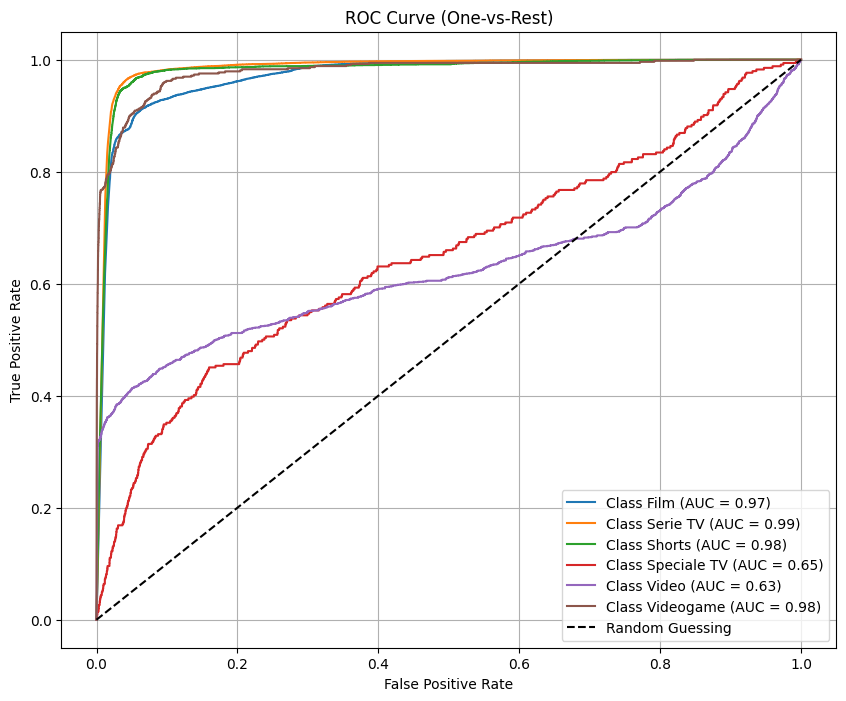

In [112]:
plt.figure(figsize=(10, 8))

for i, class_label in enumerate(le.classes_):
    # ROC curve per la classe i
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_prob[:, i])
    auc = roc_auc_score(y_test_binarized[:, i], y_prob[:, i])
    
    # Traccia la curva ROC
    plt.plot(fpr, tpr, label=f"Class {class_label} (AUC = {auc:.2f})")

# Linea casuale per riferimento
plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")

# Personalizza il grafico
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (One-vs-Rest)")
plt.legend(loc="best")
plt.grid()
plt.show()

In [113]:
# AUC (AREA UNDER THE CURVE, Ti dice quanto bene il modello riesce a distinguere tra le classi.) 
# media di tutte le classi (le singole sono gia nel grafico)
roc_auc_score(y_test_binarized, y_prob, multi_class="ovr", average="macro")

np.float64(0.8658897205123403)

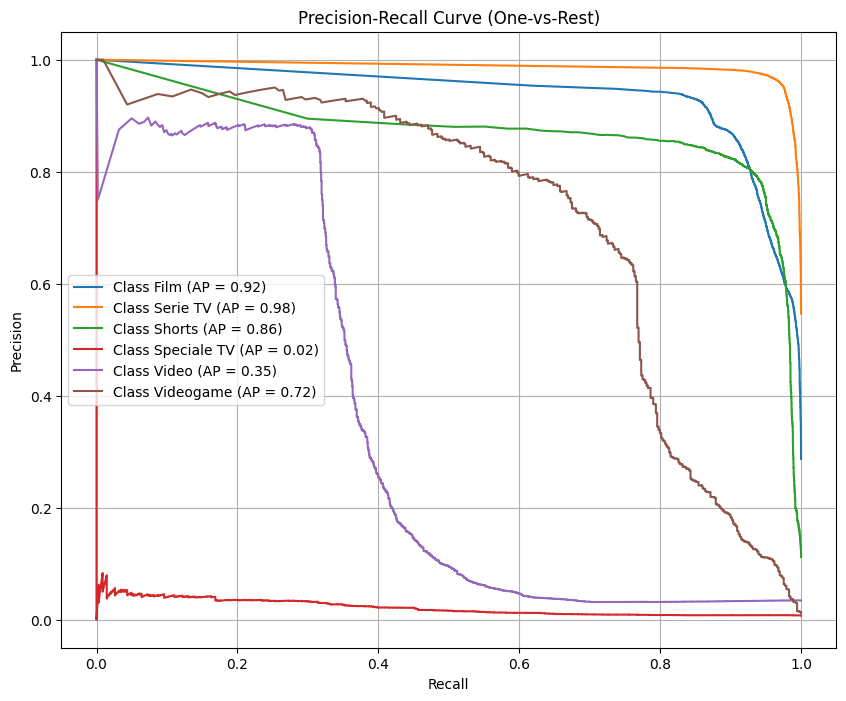

In [114]:
from sklearn.metrics import precision_recall_curve, average_precision_score

plt.figure(figsize=(10, 8))

for i, class_label in enumerate(le.classes_):
    # Precision-Recall curve per la classe i
    precision, recall, _ = precision_recall_curve(y_test_binarized[:, i], y_prob[:, i])
    ap = average_precision_score(y_test_binarized[:, i], y_prob[:, i])
    
    # Traccia la curva Precision-Recall
    plt.plot(recall, precision, label=f"Class {class_label} (AP = {ap:.2f})")

# Personalizza il grafico
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve (One-vs-Rest)")
plt.legend(loc="best")
plt.grid()
plt.show()